## Workplace setup

In [1]:
import pandas as pd

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF
from sklearn.feature_extraction import text

In [4]:
from nltk.corpus import stopwords
from nltk import word_tokenize, pos_tag
from nltk.stem import WordNetLemmatizer

In [5]:
import gensim.corpora as corpora

In [6]:
import gensim
from gensim.utils import simple_preprocess
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to C:\Users\Amy
[nltk_data]     Farrow\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [7]:
from nltk.tokenize import RegexpTokenizer

In [8]:
import numpy as np

In [9]:
from gensim.models import LdaModel, CoherenceModel

In [10]:
import gensim.corpora as corpora
import itertools

In [121]:
from collections import Counter

In [129]:
import datetime

## Load data collected by PSAW

In [6]:
submissions_full = pd.read_csv('submissions_full.csv', encoding = "UTF-8")
comments_full = pd.read_csv('comments_full.csv', encoding = "UTF-8")

In [7]:
submissions_full.head(10)

,Unnamed: 0,author,created_utc,id,num_comments,score,selftext,title,total_awards_received,created
0,0,PradaPrincess91,1622519891,npl5ro,31,1,NaN,I just created a new course! Now we are one of...,0.0,1.622534e+09
1,1,PopCultureNerd,1622517103,npkd6c,47,1,NaN,The Native Scholar Who Wasn’t - More than a de...,0.0,1.622532e+09
2,2,etoni888,1622508163,nphog5,8,1,**Extension Request** \n\nI had an issue while...,Accidental Poetry,0.0,1.622523e+09
3,3,InvestigationTeamA34,1622507848,nphkua,53,1,NaN,What percent of students do you think cheat?,0.0,1.622522e+09
4,4,LowerAlternative7564,1622501952,npfoyv,4,1,The whiny ones who argue and act immature. Ne...,I’ve never seen the kinds of students you talk...,0.0,1.622516e+09
5,5,UnemployableVeggie1,1622496158,npdq5k,0,1,[removed],I would honestly rather get raped or beaten up...,0.0,1.622511e+09
6,6,PopCultureNerd,1622485579,np9x8h,39,2,"Hey all,\n\nPBS just published this piece abou...","""Older adults are heading to college in pursui...",0.0,1.622500e+09
7,7,RIntegralDomainR,1622481820,np8jl2,0,2,NaN,This is something you've been missing from bei...,0.0,1.622496e+09
8,8,Dizzy_Comb_7486,1622476921,np6rfl,43,0,I've given up on caring about my rmp profile e...,Is there any way to not have my ratemyprofesso...,0.0,1.622491e+09
9,9,xaanthar,1622471167,np4m3v,89,9,I just graded an assignment.\n\nOn paper.\n\nW...,I just did a very strange thing.,0.0,1.622486e+09


In [8]:
comments_full.head(10)

,Unnamed: 0,author,body,created_utc,id,link_id,score,created
0,0,starfries,Legend has it there once were students who eve...,1622519978,h05nu21,t3_np4m3v,2,1.622534e+09
1,1,starfries,I thought grading was always done in pen so st...,1622519861,h05nnj1,t3_np4m3v,6,1.622534e+09
2,2,Ulrich_Plays,"You didn't, BUT you equated it to less than th...",1622519840,h05nmae,t3_nphkua,2,1.622534e+09
3,3,Ulrich_Plays,It isn't one of constant crying for help with ...,1622519761,h05nhtv,t3_nphkua,3,1.622534e+09
4,4,starfries,I'm so thankful the administration here agrees...,1622519654,h05nbro,t3_np4m3v,3,1.622534e+09
5,5,InvestigationTeamA34,You don't live a life on Reddit?,1622519593,h05n8c8,t3_nphkua,0,1.622534e+09
6,6,sourdoughobsessed,You don’t focus on academics though. You focus...,1622519529,h05n4n6,t3_nphkua,5,1.622534e+09
7,7,urnbabyurn,That’s lazy analysis. What about American cult...,1622519525,h05n4ff,t3_no6beu,1,1.622534e+09
8,8,Eigengrad,"Lol, you called someone a liar upthread when y...",1622519504,h05n399,t3_nphkua,2,1.622534e+09
9,9,InvestigationTeamA34,The issue is if I start to try to socialize or...,1622519453,h05n09q,t3_nphkua,1,1.622534e+09


## Connect post and comment data

In [11]:
submissions_full['text'] = submissions_full.title.astype(str) + " " + submissions_full.selftext.astype(str)
submissions_full.head(10)

,Unnamed: 0,author,created_utc,id,num_comments,score,selftext,title,total_awards_received,created,text
0,0,PradaPrincess91,1622519891,npl5ro,31,1,NaN,I just created a new course! Now we are one of...,0.0,1.622534e+09,I just created a new course! Now we are one of...
1,1,PopCultureNerd,1622517103,npkd6c,47,1,NaN,The Native Scholar Who Wasn’t - More than a de...,0.0,1.622532e+09,The Native Scholar Who Wasn’t - More than a de...
2,2,etoni888,1622508163,nphog5,8,1,**Extension Request** \n\nI had an issue while...,Accidental Poetry,0.0,1.622523e+09,Accidental Poetry **Extension Request** \n\nI ...
3,3,InvestigationTeamA34,1622507848,nphkua,53,1,NaN,What percent of students do you think cheat?,0.0,1.622522e+09,What percent of students do you think cheat? nan
4,4,LowerAlternative7564,1622501952,npfoyv,4,1,The whiny ones who argue and act immature. Ne...,I’ve never seen the kinds of students you talk...,0.0,1.622516e+09,I’ve never seen the kinds of students you talk...
5,5,UnemployableVeggie1,1622496158,npdq5k,0,1,[removed],I would honestly rather get raped or beaten up...,0.0,1.622511e+09,I would honestly rather get raped or beaten up...
6,6,PopCultureNerd,1622485579,np9x8h,39,2,"Hey all,\n\nPBS just published this piece abou...","""Older adults are heading to college in pursui...",0.0,1.622500e+09,"""Older adults are heading to college in pursui..."
7,7,RIntegralDomainR,1622481820,np8jl2,0,2,NaN,This is something you've been missing from bei...,0.0,1.622496e+09,This is something you've been missing from bei...
8,8,Dizzy_Comb_7486,1622476921,np6rfl,43,0,I've given up on caring about my rmp profile e...,Is there any way to not have my ratemyprofesso...,0.0,1.622491e+09,Is there any way to not have my ratemyprofesso...
9,9,xaanthar,1622471167,np4m3v,89,9,I just graded an assignment.\n\nOn paper.\n\nW...,I just did a very strange thing.,0.0,1.622486e+09,I just did a very strange thing. I just graded...


In [12]:
submissions_full = submissions_full.drop(['Unnamed: 0', 'author', 'created_utc', 'num_comments', 'score', \
                                          'selftext', 'title', 'total_awards_received'], axis = 1)
submissions_full.head(10)

,id,created,text
0,npl5ro,1.622534e+09,I just created a new course! Now we are one of...
1,npkd6c,1.622532e+09,The Native Scholar Who Wasn’t - More than a de...
2,nphog5,1.622523e+09,Accidental Poetry **Extension Request** \n\nI ...
3,nphkua,1.622522e+09,What percent of students do you think cheat? nan
4,npfoyv,1.622516e+09,I’ve never seen the kinds of students you talk...
5,npdq5k,1.622511e+09,I would honestly rather get raped or beaten up...
6,np9x8h,1.622500e+09,"""Older adults are heading to college in pursui..."
7,np8jl2,1.622496e+09,This is something you've been missing from bei...
8,np6rfl,1.622491e+09,Is there any way to not have my ratemyprofesso...
9,np4m3v,1.622486e+09,I just did a very strange thing. I just graded...


In [13]:
comments_full['post_id'] = comments_full.link_id.str.slice(3, )
comments_full.head(10)

,Unnamed: 0,author,body,created_utc,id,link_id,score,created,post_id
0,0,starfries,Legend has it there once were students who eve...,1622519978,h05nu21,t3_np4m3v,2,1.622534e+09,np4m3v
1,1,starfries,I thought grading was always done in pen so st...,1622519861,h05nnj1,t3_np4m3v,6,1.622534e+09,np4m3v
2,2,Ulrich_Plays,"You didn't, BUT you equated it to less than th...",1622519840,h05nmae,t3_nphkua,2,1.622534e+09,nphkua
3,3,Ulrich_Plays,It isn't one of constant crying for help with ...,1622519761,h05nhtv,t3_nphkua,3,1.622534e+09,nphkua
4,4,starfries,I'm so thankful the administration here agrees...,1622519654,h05nbro,t3_np4m3v,3,1.622534e+09,np4m3v
5,5,InvestigationTeamA34,You don't live a life on Reddit?,1622519593,h05n8c8,t3_nphkua,0,1.622534e+09,nphkua
6,6,sourdoughobsessed,You don’t focus on academics though. You focus...,1622519529,h05n4n6,t3_nphkua,5,1.622534e+09,nphkua
7,7,urnbabyurn,That’s lazy analysis. What about American cult...,1622519525,h05n4ff,t3_no6beu,1,1.622534e+09,no6beu
8,8,Eigengrad,"Lol, you called someone a liar upthread when y...",1622519504,h05n399,t3_nphkua,2,1.622534e+09,nphkua
9,9,InvestigationTeamA34,The issue is if I start to try to socialize or...,1622519453,h05n09q,t3_nphkua,1,1.622534e+09,nphkua


In [14]:
comments_full = comments_full.drop(['Unnamed: 0', 'author', 'created_utc', 'id', \
                                    'link_id', 'score'], axis = 1)
comments_full.head(10)

,body,created,post_id
0,Legend has it there once were students who eve...,1.622534e+09,np4m3v
1,I thought grading was always done in pen so st...,1.622534e+09,np4m3v
2,"You didn't, BUT you equated it to less than th...",1.622534e+09,nphkua
3,It isn't one of constant crying for help with ...,1.622534e+09,nphkua
4,I'm so thankful the administration here agrees...,1.622534e+09,np4m3v
5,You don't live a life on Reddit?,1.622534e+09,nphkua
6,You don’t focus on academics though. You focus...,1.622534e+09,nphkua
7,That’s lazy analysis. What about American cult...,1.622534e+09,no6beu
8,"Lol, you called someone a liar upthread when y...",1.622534e+09,nphkua
9,The issue is if I start to try to socialize or...,1.622534e+09,nphkua


## Link submissions and comment data

In [15]:
def join_comment_submission(ID):
    return comments_full[comments_full.post_id == ID].body.str.cat(sep = " ")

In [16]:
posts_full = submissions_full
posts_full['comments'] = posts_full.id.apply(join_comment_submission)
posts_full.head(10)

,id,created,text,comments
0,npl5ro,1.622534e+09,I just created a new course! Now we are one of...,
1,npkd6c,1.622532e+09,The Native Scholar Who Wasn’t - More than a de...,I thought the article was referring to Elizabe...
2,nphog5,1.622523e+09,Accidental Poetry **Extension Request** \n\nI ...,Both are direct pastes from student emails. Th...
3,nphkua,1.622522e+09,What percent of students do you think cheat? nan,"You didn't, BUT you equated it to less than th..."
4,npfoyv,1.622516e+09,I’ve never seen the kinds of students you talk...,[removed] Why do I suspect that this isn't in ...
5,npdq5k,1.622511e+09,I would honestly rather get raped or beaten up...,
6,np9x8h,1.622500e+09,"""Older adults are heading to college in pursui...",Why are you so cruel? The world needs baristas...
7,np8jl2,1.622496e+09,This is something you've been missing from bei...,
8,np6rfl,1.622491e+09,Is there any way to not have my ratemyprofesso...,You are giving RMP too much weight. Just igno...
9,np4m3v,1.622486e+09,I just did a very strange thing. I just graded...,Legend has it there once were students who eve...


In [17]:
posts_full['full_text'] = posts_full.text.str.cat(posts_full.comments, sep = " ", na_rep = '')
posts_full.head(10)

,id,created,text,comments,full_text
0,npl5ro,1.622534e+09,I just created a new course! Now we are one of...,,I just created a new course! Now we are one of...
1,npkd6c,1.622532e+09,The Native Scholar Who Wasn’t - More than a de...,I thought the article was referring to Elizabe...,The Native Scholar Who Wasn’t - More than a de...
2,nphog5,1.622523e+09,Accidental Poetry **Extension Request** \n\nI ...,Both are direct pastes from student emails. Th...,Accidental Poetry **Extension Request** \n\nI ...
3,nphkua,1.622522e+09,What percent of students do you think cheat? nan,"You didn't, BUT you equated it to less than th...",What percent of students do you think cheat? n...
4,npfoyv,1.622516e+09,I’ve never seen the kinds of students you talk...,[removed] Why do I suspect that this isn't in ...,I’ve never seen the kinds of students you talk...
5,npdq5k,1.622511e+09,I would honestly rather get raped or beaten up...,,I would honestly rather get raped or beaten up...
6,np9x8h,1.622500e+09,"""Older adults are heading to college in pursui...",Why are you so cruel? The world needs baristas...,"""Older adults are heading to college in pursui..."
7,np8jl2,1.622496e+09,This is something you've been missing from bei...,,This is something you've been missing from bei...
8,np6rfl,1.622491e+09,Is there any way to not have my ratemyprofesso...,You are giving RMP too much weight. Just igno...,Is there any way to not have my ratemyprofesso...
9,np4m3v,1.622486e+09,I just did a very strange thing. I just graded...,Legend has it there once were students who eve...,I just did a very strange thing. I just graded...


In [18]:
posts_full = posts_full.drop(['id', 'text', 'comments'], axis = 1)
posts_full.head(10)

,created,full_text
0,1.622534e+09,I just created a new course! Now we are one of...
1,1.622532e+09,The Native Scholar Who Wasn’t - More than a de...
2,1.622523e+09,Accidental Poetry **Extension Request** \n\nI ...
3,1.622522e+09,What percent of students do you think cheat? n...
4,1.622516e+09,I’ve never seen the kinds of students you talk...
5,1.622511e+09,I would honestly rather get raped or beaten up...
6,1.622500e+09,"""Older adults are heading to college in pursui..."
7,1.622496e+09,This is something you've been missing from bei...
8,1.622491e+09,Is there any way to not have my ratemyprofesso...
9,1.622486e+09,I just did a very strange thing. I just graded...


In [23]:
posts_full.head(50)

,created,full_text
0,1.622534e+09,i just created a new course now we are one of ...
1,1.622532e+09,the native scholar who wasn t more than a deca...
2,1.622523e+09,accidental poetry extension request i had an i...
3,1.622522e+09,what percent of students do you think cheat na...
4,1.622516e+09,i ve never seen the kinds of students you talk...
5,1.622511e+09,i would honestly rather get raped or beaten up...
6,1.622500e+09,older adults are heading to college in pursui...
7,1.622496e+09,this is something you ve been missing from bei...
8,1.622491e+09,is there any way to not have my ratemyprofesso...
9,1.622486e+09,i just did a very strange thing i just graded ...


In [25]:
posts_full.to_csv('posts_full.csv')

## Clean text

In [20]:
posts_clean = posts_full
posts_clean.full_text = posts_clean.full_text.replace('[removed]', " ")
posts_clean.full_text = posts_clean.full_text.replace('[deleted]', " ")
posts_clean.full_text = posts_clean.full_text.replace('\n', " ")
posts_clean.full_text = posts_clean.full_text.replace("[^a-zA-Z]+", " ", regex = True)
posts_clean.full_text = posts_clean.full_text.str.lower()
posts_clean.head(10)

,created,full_text
0,1.622534e+09,i just created a new course now we are one of ...
1,1.622532e+09,the native scholar who wasn t more than a deca...
2,1.622523e+09,accidental poetry extension request i had an i...
3,1.622522e+09,what percent of students do you think cheat na...
4,1.622516e+09,i ve never seen the kinds of students you talk...
5,1.622511e+09,i would honestly rather get raped or beaten up...
6,1.622500e+09,older adults are heading to college in pursui...
7,1.622496e+09,this is something you ve been missing from bei...
8,1.622491e+09,is there any way to not have my ratemyprofesso...
9,1.622486e+09,i just did a very strange thing i just graded ...


In [26]:
posts_clean.to_csv('posts_clean.csv')

## Lemmatization and stopword removal

In [30]:
def get_lemma(word_tags):
    wordnet_lemmatizer = WordNetLemmatizer()
    lemma = []
    for element in word_tags:
        word = element[0][0]
        pos = element[0][1]
        tag = nltk.pos_tag([word])[0][1][0].upper()
        tag_dict = {"J": wordnet.ADJ,
                   "N": wordnet.NOUN,
                   "V": wordnet.VERB,
                   "R": wordnet.ADV}
        wordnet_pos = tag_dict.get(tag, wordnet.NOUN)
        lemma.append(wordnet_lemmatizer.lemmatize(word, wordnet_pos))
    return(lemma)

In [15]:
stop = ["professor", "student", "college", "https", "com", "www", "amp", "reddit", "comment", "link", "don", "nan", "http"]
stop_words_agg = stopwords.words('english')+ stop

In [138]:
posts_clean["tokens"] = posts_clean.full_text.apply(word_tokenize)
posts_clean.head(10)

,created,full_text,tokens,tokens_nostop
0,1.622534e+09,i just created a new course now we are one of ...,"[i, just, created, a, new, course, now, we, ar...","[created, new, course, one, social, work, prog..."
1,1.622532e+09,the native scholar who wasn t more than a deca...,"[the, native, scholar, who, wasn, t, more, tha...","[native, scholar, decade, ago, prominent, acad..."
2,1.622523e+09,accidental poetry extension request i had an i...,"[accidental, poetry, extension, request, i, ha...","[accidental, poetry, extension, request, issue..."
3,1.622522e+09,what percent of students do you think cheat na...,"[what, percent, of, students, do, you, think, ...","[percent, students, think, cheat, nan, equated..."
4,1.622516e+09,i ve never seen the kinds of students you talk...,"[i, ve, never, seen, the, kinds, of, students,...","[never, seen, kinds, students, talk, whiny, on..."
5,1.622511e+09,i would honestly rather get raped or beaten up...,"[i, would, honestly, rather, get, raped, or, b...","[would, honestly, rather, get, raped, beaten, ..."
6,1.622500e+09,older adults are heading to college in pursui...,"[older, adults, are, heading, to, college, in,...","[older, adults, heading, pursuit, new, opportu..."
7,1.622496e+09,this is something you ve been missing from bei...,"[this, is, something, you, ve, been, missing, ...","[something, missing, f, f, come, know, missed,..."
8,1.622491e+09,is there any way to not have my ratemyprofesso...,"[is, there, any, way, to, not, have, my, ratem...","[way, ratemyprofessors, profile, show, google,..."
9,1.622486e+09,i just did a very strange thing i just graded ...,"[i, just, did, a, very, strange, thing, i, jus...","[strange, thing, graded, assignment, paper, pe..."


In [156]:
def remove_stopwords(tokens):
    words = []
    for token in tokens:
        if len(token) > 1:
            if token not in stop_words_agg:
                words.append(token)
    return words

In [157]:
posts_clean["tokens_nostop"] = posts_clean.tokens.apply(remove_stopwords)
posts_clean.head(10)

,created,full_text,tokens,tokens_nostop
0,1.622534e+09,i just created a new course now we are one of ...,"[i, just, created, a, new, course, now, we, ar...","[created, new, course, one, social, work, prog..."
1,1.622532e+09,the native scholar who wasn t more than a deca...,"[the, native, scholar, who, wasn, t, more, tha...","[native, scholar, decade, ago, prominent, acad..."
2,1.622523e+09,accidental poetry extension request i had an i...,"[accidental, poetry, extension, request, i, ha...","[accidental, poetry, extension, request, issue..."
3,1.622522e+09,what percent of students do you think cheat na...,"[what, percent, of, students, do, you, think, ...","[percent, students, think, cheat, equated, les..."
4,1.622516e+09,i ve never seen the kinds of students you talk...,"[i, ve, never, seen, the, kinds, of, students,...","[never, seen, kinds, students, talk, whiny, on..."
5,1.622511e+09,i would honestly rather get raped or beaten up...,"[i, would, honestly, rather, get, raped, or, b...","[would, honestly, rather, get, raped, beaten, ..."
6,1.622500e+09,older adults are heading to college in pursui...,"[older, adults, are, heading, to, college, in,...","[older, adults, heading, pursuit, new, opportu..."
7,1.622496e+09,this is something you ve been missing from bei...,"[this, is, something, you, ve, been, missing, ...","[something, missing, come, know, missed]"
8,1.622491e+09,is there any way to not have my ratemyprofesso...,"[is, there, any, way, to, not, have, my, ratem...","[way, ratemyprofessors, profile, show, google,..."
9,1.622486e+09,i just did a very strange thing i just graded ...,"[i, just, did, a, very, strange, thing, i, jus...","[strange, thing, graded, assignment, paper, pe..."


In [161]:
def lemmatize(tokens, allowed_postags=['NN', 'JJ', 'VBG', 'RB', 'JJR', 'JJS', 'RBR', 'RBS', 'VBD', 'VBG', 'VBN', 'VBP', 'VBZ']):
    wordnet_lemmatizer = WordNetLemmatizer()
    tokens_out = []
    for token in tokens:
        lemma = wordnet_lemmatizer.lemmatize(token)
        if nltk.pos_tag([lemma])[0][1] in allowed_postags:
            tokens_out.append(lemma)
    return tokens_out

In [162]:
posts_clean["lemmatized"] = posts_clean.tokens_nostop.apply(lemmatize)

In [163]:
posts_clean.head(10)

,created,full_text,tokens,tokens_nostop,lemmatized
0,1.622534e+09,i just created a new course now we are one of ...,"[i, just, created, a, new, course, now, we, ar...","[created, new, course, one, social, work, prog...","[created, new, course, social, work, program, ..."
1,1.622532e+09,the native scholar who wasn t more than a deca...,"[the, native, scholar, who, wasn, t, more, tha...","[native, scholar, decade, ago, prominent, acad...","[native, scholar, decade, ago, prominent, acad..."
2,1.622523e+09,accidental poetry extension request i had an i...,"[accidental, poetry, extension, request, i, ha...","[accidental, poetry, extension, request, issue...","[accidental, poetry, extension, request, issue..."
3,1.622522e+09,what percent of students do you think cheat na...,"[what, percent, of, students, do, you, think, ...","[percent, students, think, cheat, equated, les...","[percent, student, think, cheat, equated, le, ..."
4,1.622516e+09,i ve never seen the kinds of students you talk...,"[i, ve, never, seen, the, kinds, of, students,...","[never, seen, kinds, students, talk, whiny, on...","[never, seen, kind, student, talk, whiny, argu..."
5,1.622511e+09,i would honestly rather get raped or beaten up...,"[i, would, honestly, rather, get, raped, or, b...","[would, honestly, rather, get, raped, beaten, ...","[honestly, rather, raped, beaten, rather, suff..."
6,1.622500e+09,older adults are heading to college in pursui...,"[older, adults, are, heading, to, college, in,...","[older, adults, heading, pursuit, new, opportu...","[older, adult, heading, pursuit, new, opportun..."
7,1.622496e+09,this is something you ve been missing from bei...,"[this, is, something, you, ve, been, missing, ...","[something, missing, come, know, missed]","[something, missing, missed]"
8,1.622491e+09,is there any way to not have my ratemyprofesso...,"[is, there, any, way, to, not, have, my, ratem...","[way, ratemyprofessors, profile, show, google,...","[way, profile, show, google, search, name, giv..."
9,1.622486e+09,i just did a very strange thing i just graded ...,"[i, just, did, a, very, strange, thing, i, jus...","[strange, thing, graded, assignment, paper, pe...","[strange, thing, graded, assignment, paper, ru..."


In [170]:
posts_clean["lemmatized_text"] = posts_clean.lemmatized.apply(' '.join)
posts_clean.head(10)

,created,full_text,tokens,tokens_nostop,lemmatized,lemmatized_text
0,1.622534e+09,i just created a new course now we are one of ...,"[i, just, created, a, new, course, now, we, ar...","[created, new, course, one, social, work, prog...","[created, new, course, social, work, program, ...",created new course social work program offer d...
1,1.622532e+09,the native scholar who wasn t more than a deca...,"[the, native, scholar, who, wasn, t, more, tha...","[native, scholar, decade, ago, prominent, acad...","[native, scholar, decade, ago, prominent, acad...",native scholar decade ago prominent academic e...
2,1.622523e+09,accidental poetry extension request i had an i...,"[accidental, poetry, extension, request, i, ha...","[accidental, poetry, extension, request, issue...","[accidental, poetry, extension, request, issue...",accidental poetry extension request issue edit...
3,1.622522e+09,what percent of students do you think cheat na...,"[what, percent, of, students, do, you, think, ...","[percent, students, think, cheat, equated, les...","[percent, student, think, cheat, equated, le, ...",percent student think cheat equated le torture...
4,1.622516e+09,i ve never seen the kinds of students you talk...,"[i, ve, never, seen, the, kinds, of, students,...","[never, seen, kinds, students, talk, whiny, on...","[never, seen, kind, student, talk, whiny, argu...",never seen kind student talk whiny argue act i...
5,1.622511e+09,i would honestly rather get raped or beaten up...,"[i, would, honestly, rather, get, raped, or, b...","[would, honestly, rather, get, raped, beaten, ...","[honestly, rather, raped, beaten, rather, suff...",honestly rather raped beaten rather suffer rem...
6,1.622500e+09,older adults are heading to college in pursui...,"[older, adults, are, heading, to, college, in,...","[older, adults, heading, pursuit, new, opportu...","[older, adult, heading, pursuit, new, opportun...",older adult heading pursuit new opportunity si...
7,1.622496e+09,this is something you ve been missing from bei...,"[this, is, something, you, ve, been, missing, ...","[something, missing, come, know, missed]","[something, missing, missed]",something missing missed
8,1.622491e+09,is there any way to not have my ratemyprofesso...,"[is, there, any, way, to, not, have, my, ratem...","[way, ratemyprofessors, profile, show, google,...","[way, profile, show, google, search, name, giv...",way profile show google search name given cari...
9,1.622486e+09,i just did a very strange thing i just graded ...,"[i, just, did, a, very, strange, thing, i, jus...","[strange, thing, graded, assignment, paper, pe...","[strange, thing, graded, assignment, paper, ru...",strange thing graded assignment paper rumor an...


In [230]:
posts_clean.to_csv('posts_clean_.csv')

In [46]:
posts_clean = pd.read_csv('posts_clean_.csv', encoding = "UTF-8")

In [47]:
posts_clean.head(10)

,Unnamed: 0,created,full_text,tokens,tokens_nostop,lemmatized,lemmatized_text
0,0,1.622534e+09,i just created a new course now we are one of ...,"['i', 'just', 'created', 'a', 'new', 'course',...","['created', 'new', 'course', 'one', 'social', ...","['created', 'new', 'course', 'social', 'work',...",created new course social work program offer d...
1,1,1.622532e+09,the native scholar who wasn t more than a deca...,"['the', 'native', 'scholar', 'who', 'wasn', 't...","['native', 'scholar', 'decade', 'ago', 'promin...","['native', 'scholar', 'decade', 'ago', 'promin...",native scholar decade ago prominent academic e...
2,2,1.622523e+09,accidental poetry extension request i had an i...,"['accidental', 'poetry', 'extension', 'request...","['accidental', 'poetry', 'extension', 'request...","['accidental', 'poetry', 'extension', 'request...",accidental poetry extension request issue edit...
3,3,1.622522e+09,what percent of students do you think cheat na...,"['what', 'percent', 'of', 'students', 'do', 'y...","['percent', 'students', 'think', 'cheat', 'equ...","['percent', 'student', 'think', 'cheat', 'equa...",percent student think cheat equated le torture...
4,4,1.622516e+09,i ve never seen the kinds of students you talk...,"['i', 've', 'never', 'seen', 'the', 'kinds', '...","['never', 'seen', 'kinds', 'students', 'talk',...","['never', 'seen', 'kind', 'student', 'talk', '...",never seen kind student talk whiny argue act i...
5,5,1.622511e+09,i would honestly rather get raped or beaten up...,"['i', 'would', 'honestly', 'rather', 'get', 'r...","['would', 'honestly', 'rather', 'get', 'raped'...","['honestly', 'rather', 'raped', 'beaten', 'rat...",honestly rather raped beaten rather suffer rem...
6,6,1.622500e+09,older adults are heading to college in pursui...,"['older', 'adults', 'are', 'heading', 'to', 'c...","['older', 'adults', 'heading', 'pursuit', 'new...","['older', 'adult', 'heading', 'pursuit', 'new'...",older adult heading pursuit new opportunity si...
7,7,1.622496e+09,this is something you ve been missing from bei...,"['this', 'is', 'something', 'you', 've', 'been...","['something', 'missing', 'come', 'know', 'miss...","['something', 'missing', 'missed']",something missing missed
8,8,1.622491e+09,is there any way to not have my ratemyprofesso...,"['is', 'there', 'any', 'way', 'to', 'not', 'ha...","['way', 'ratemyprofessors', 'profile', 'show',...","['way', 'profile', 'show', 'google', 'search',...",way profile show google search name given cari...
9,9,1.622486e+09,i just did a very strange thing i just graded ...,"['i', 'just', 'did', 'a', 'very', 'strange', '...","['strange', 'thing', 'graded', 'assignment', '...","['strange', 'thing', 'graded', 'assignment', '...",strange thing graded assignment paper rumor an...


In [62]:
posts_clean.lemmatized = posts_clean.lemmatized_text.astype(str).apply(lambda x: x.split(' '))
posts_clean.head(10)

,Unnamed: 0,created,full_text,tokens,tokens_nostop,lemmatized,lemmatized_text
0,0,1.622534e+09,i just created a new course now we are one of ...,"['i', 'just', 'created', 'a', 'new', 'course',...","['created', 'new', 'course', 'one', 'social', ...","[created, new, course, social, work, program, ...",created new course social work program offer d...
1,1,1.622532e+09,the native scholar who wasn t more than a deca...,"['the', 'native', 'scholar', 'who', 'wasn', 't...","['native', 'scholar', 'decade', 'ago', 'promin...","[native, scholar, decade, ago, prominent, acad...",native scholar decade ago prominent academic e...
2,2,1.622523e+09,accidental poetry extension request i had an i...,"['accidental', 'poetry', 'extension', 'request...","['accidental', 'poetry', 'extension', 'request...","[accidental, poetry, extension, request, issue...",accidental poetry extension request issue edit...
3,3,1.622522e+09,what percent of students do you think cheat na...,"['what', 'percent', 'of', 'students', 'do', 'y...","['percent', 'students', 'think', 'cheat', 'equ...","[percent, student, think, cheat, equated, le, ...",percent student think cheat equated le torture...
4,4,1.622516e+09,i ve never seen the kinds of students you talk...,"['i', 've', 'never', 'seen', 'the', 'kinds', '...","['never', 'seen', 'kinds', 'students', 'talk',...","[never, seen, kind, student, talk, whiny, argu...",never seen kind student talk whiny argue act i...
5,5,1.622511e+09,i would honestly rather get raped or beaten up...,"['i', 'would', 'honestly', 'rather', 'get', 'r...","['would', 'honestly', 'rather', 'get', 'raped'...","[honestly, rather, raped, beaten, rather, suff...",honestly rather raped beaten rather suffer rem...
6,6,1.622500e+09,older adults are heading to college in pursui...,"['older', 'adults', 'are', 'heading', 'to', 'c...","['older', 'adults', 'heading', 'pursuit', 'new...","[older, adult, heading, pursuit, new, opportun...",older adult heading pursuit new opportunity si...
7,7,1.622496e+09,this is something you ve been missing from bei...,"['this', 'is', 'something', 'you', 've', 'been...","['something', 'missing', 'come', 'know', 'miss...","[something, missing, missed]",something missing missed
8,8,1.622491e+09,is there any way to not have my ratemyprofesso...,"['is', 'there', 'any', 'way', 'to', 'not', 'ha...","['way', 'ratemyprofessors', 'profile', 'show',...","[way, profile, show, google, search, name, giv...",way profile show google search name given cari...
9,9,1.622486e+09,i just did a very strange thing i just graded ...,"['i', 'just', 'did', 'a', 'very', 'strange', '...","['strange', 'thing', 'graded', 'assignment', '...","[strange, thing, graded, assignment, paper, ru...",strange thing graded assignment paper rumor an...


# EDA

In [126]:
counts = posts_clean["word_count"] = posts_clean.full_text.astype(str).apply(lambda x: x.split(' ')).apply(len)

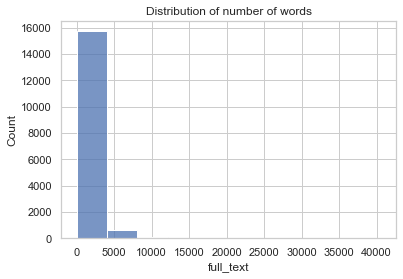

In [127]:
sns.histplot(data= counts, bins= 10)
plt.title('Distribution of number of words')

plt.show()

In [117]:
all_text = ' '.join(posts_clean.lemmatized_text.astype(str).tolist())

In [119]:
all_words = all_text.split(sep = " ")

In [122]:
top_20 = pd.DataFrame(Counter(all_words).most_common(20), columns=['word', 'frequency'])

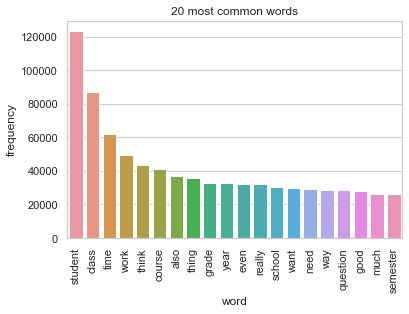

In [128]:
sns.barplot(x='word', y='frequency', data=top_20)
plt.xticks(rotation=90)
plt.title('20 most common words')

plt.show()

In [144]:
posts_clean['day'] = posts_clean.created.apply(datetime.datetime.fromtimestamp).dt.strftime('%Y-%m-%d')

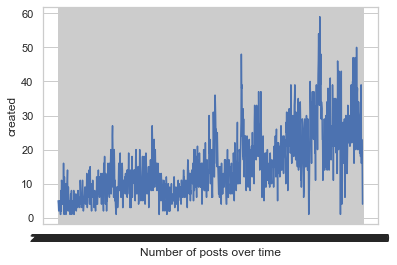

In [164]:
plot = sns.lineplot(x = 'day',
             y = 'created',
             data = posts_clean.groupby(["day"]).count())
plot.set(xlabel = 'Number of posts over time')
plt.show(plot)

## TFIDF matrix

In [19]:
vectorizer = TfidfVectorizer(stop_words = stop_words_agg, 
                             ngram_range = (1,1), 
                             max_df = 0.8, 
                             min_df = 0.1)

In [26]:
data_vectorizer = vectorizer.fit_transform(posts_clean.lemmatized_text.fillna(' '))

In [27]:
data_vectorized = pd.DataFrame(data_vectorizer.toarray(), columns = vectorizer.get_feature_names())

data_vectorized.index = posts_clean.index

data_vectorized.head(10)

,ability,able,absolutely,academia,academic,access,activity,actual,actually,address,...,write,writing,written,wrong,wrote,yeah,year,yet,zero,zoom
0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.0,0.000000,0.000000,0.0,0.234018,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.076973,0.000000,...,0.000000,0.097595,0.117008,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.0,0.000000,0.000000,0.0,0.160688,0.0,0.0,0.049706,0.065360,0.000000,...,0.000000,0.041436,0.000000,0.000000,0.000000,0.040840,0.028716,0.044015,0.052718,0.000000
4,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.0,0.000000,0.056684,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.051959,0.000000,0.000000,0.035287,0.000000,0.000000,0.000000
7,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.0,0.052033,0.031349,0.0,0.027300,0.0,0.0,0.000000,0.044418,0.000000,...,0.110642,0.000000,0.000000,0.000000,0.144899,0.000000,0.195154,0.000000,0.000000,0.000000
9,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.037582,0.049418,0.042048,...,0.000000,0.031329,0.037561,0.127884,0.040303,0.030879,0.043425,0.000000,0.079719,0.039388


# LDA

## Figuring out the optimal number of topics

In [64]:
data_words = posts_clean.lemmatized.tolist()
data_words = list(data_words)

In [65]:
id2word = corpora.Dictionary(data_words)

In [66]:
texts = data_words
corpus = [id2word.doc2bow(text) for text in texts]

In [90]:
texts

[['created',
  'new',
  'course',
  'social',
  'work',
  'program',
  'offer',
  'disability',
  'course'],
 ['native',
  'scholar',
  'decade',
  'ago',
  'prominent',
  'academic',
  'exposed',
  'faked',
  'cherokee',
  'ancestry',
  'career',
  'continued',
  'thrive',
  'thought',
  'article',
  'referring',
  'first',
  'want',
  'deal',
  'pay',
  'wall',
  'someone',
  'posted',
  'long',
  'article',
  'comment',
  'nl',
  'im',
  'native',
  'scholar',
  'wasnt',
  'decade',
  'gzfu',
  'dl'],
 ['accidental',
  'poetry',
  'extension',
  'request',
  'issue',
  'editing',
  'video',
  'screen',
  'laptop',
  'working',
  'properly',
  'due',
  'edit',
  'end',
  'submitted',
  'video',
  'longer',
  'min',
  'way',
  'extension',
  'case',
  'anonymous',
  'direct',
  'paste',
  'email',
  'second',
  'changed',
  'word',
  'reference',
  'specific',
  'name',
  'assignment',
  'otherwise',
  'word',
  'word',
  'different',
  'student',
  'sent',
  'ironically',
  'subject'

In [89]:
corpus

[[(0, 2), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1)],
 [(8, 1),
  (9, 1),
  (10, 1),
  (11, 2),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 1),
  (17, 2),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 2),
  (26, 1),
  (27, 1),
  (28, 1),
  (29, 1),
  (30, 1),
  (31, 2),
  (32, 1),
  (33, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1)],
 [(7, 1),
  (38, 1),
  (39, 1),
  (40, 1),
  (41, 1),
  (42, 1),
  (43, 2),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 1),
  (48, 1),
  (49, 1),
  (50, 1),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 1),
  (56, 1),
  (57, 1),
  (58, 1),
  (59, 2),
  (60, 1),
  (61, 1),
  (62, 1),
  (63, 1),
  (64, 1),
  (65, 1),
  (66, 2),
  (67, 1),
  (68, 1),
  (69, 1),
  (70, 1),
  (71, 1),
  (72, 1),
  (73, 1),
  (74, 1),
  (75, 1),
  (76, 1),
  (77, 3),
  (78, 1),
  (79, 1),
  (80, 2),
  (81, 1),
  (82, 1),
  (83, 1),
  (84, 1),
  (85, 2),
  (86, 1),
  (87, 1),
  (88, 1),
  (89, 2),
  (90, 1),
  (91, 1),


In [80]:
num_topics = list(np.arange(2, 10 + 1, 1)) #TODO: change to 50

In [81]:
LDA_models = {}
for num in range(0, len(num_topics)):
    LDA_models[num] = gensim.models.LdaMulticore(corpus=corpus, id2word=id2word, num_topics=num_topics[num])

In [82]:
LDA_topics = {}
for num in range(0, len(num_topics)):
    LDA_topics[num] = LDA_models[num].print_topics()

In [93]:
LDA_coherence_scores = {}
for num in range(0, len(num_topics)):
    LDA_coherence_scores[num] = CoherenceModel(model=LDA_models[num],
                         texts=corpus,
                         dictionary=id2word,
                         coherence='c_v').get_coherence()

In [73]:
def jaccard_similarity(topic_1, topic_2):
    """
    Derives the Jaccard similarity of two topics

    Jaccard similarity:
    - A statistic used for comparing the similarity and diversity of sample sets
    - J(A,B) = (A ∩ B)/(A ∪ B)
    - Goal is low Jaccard scores for coverage of the diverse elements
    """
    intersection = set(topic_1).intersection(set(topic_2))
    union = set(topic_1).union(set(topic_2))
                    
    return float(len(intersection))/float(len(union))

In [84]:
LDA_stability = {}
for i in range(0, len(num_topics)-1):
    jaccard_sims = []
    for t1, topic1 in enumerate(LDA_topics[i]):
        sims = []
        for t2, topic2 in enumerate(LDA_topics[i+1]):
            sims.append(jaccard_similarity(topic1, topic2))    
        jaccard_sims.append(sims)    

    LDA_stability[num_topics[i]] = jaccard_sims
                
LDA_mean_stabilities = [np.array(LDA_stability[i]).mean() for i in num_topics[:-1]]

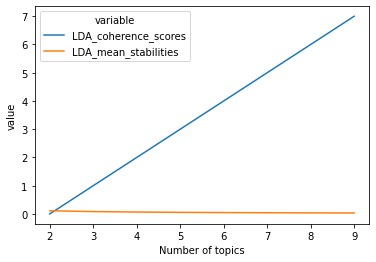

In [94]:
LDA = pd.DataFrame(list(zip(num_topics, LDA_coherence_scores, LDA_mean_stabilities)), 
                  columns = ['num_topics', 'LDA_coherence_scores', 'LDA_mean_stabilities'])
sns.lineplot(x = 'num_topics',
             y = 'value',
             hue = 'variable',
             data = pd.melt(LDA, ['num_topics']))
plt.xlabel('Number of topics')
plt.show()

TODO: the coherence score calculation isn't working. To do with how `corpus` and/or `texts` are?

## Topic model

In [ ]:
lda_model = gensim.models.LdaMulticore(corpus=corpus, id2word=id2word, num_topics= ???)

# NMF

## Figuring out the optimal number of topics

In [98]:
num_topics = list(np.arange(2, 10 + 1, 1)) #TODO: change to 50

In [99]:
NMF_models = {}
for num in range(0, len(num_topics)):
    NMF_models[num] = NMF(num_topics[num]).fit_transform(data_vectorizer)

C:\Anaconda\lib\site-packages\sklearn\decomposition\_nmf.py:312: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(("The 'init' value, when 'init=None' and "
C:\Anaconda\lib\site-packages\sklearn\decomposition\_nmf.py:312: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(("The 'init' value, when 'init=None' and "
C:\Anaconda\lib\site-packages\sklearn\decomposition\_nmf.py:312: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(("The 'init' value, when 'init=None' and "
C:\Anaconda\lib\site-packages\sklearn\decomposition\_nmf.py:312: FutureWarning: The 'init' value, wh

In [100]:
NMF_topics = {}
for num in range(0, len(num_topics)):
    NMF_topics[num] = NMF(num_topics[num]).fit_transform(data_vectorizer).components_

AttributeError: 'numpy.ndarray' object has no attribute 'components_'

TODO: generating topics from NMF so that Jaccard can be calculated as with LDA

In [ ]:
NMF_coherence_scores = {}
for num in range(0, len(num_topics)):


TODO: once coherence score above is resolved, try here

In [ ]:
NMF_stability = {}
for i in range(0, len(num_topics)-1):
    jaccard_sims = []
    for t1, topic1 in enumerate(NMF_topics[i]):
        sims = []
        for t2, topic2 in enumerate(NMF_topics[i+1]):
            sims.append(jaccard_similarity(topic1, topic2))    
        jaccard_sims.append(sims)    

    NMF_stability[num_topics[i]] = jaccard_sims
                
NMF_mean_stabilities = [np.array(NMF_stability[i]).mean() for i in num_topics[:-1]]

In [ ]:
NMF = pd.DataFrame(list(zip(num_topics, NMF_coherence_scores, NMF_mean_stabilities)), 
                  columns = ['num_topics', 'NMF_coherence_scores', 'NMF_mean_stabilities'])
sns.lineplot(x = 'num_topics',
             y = 'value',
             hue = 'variable',
             data = pd.melt(NMF, ['num_topics']))
plt.xlabel('Number of topics')
plt.show()

## Topic model

In [ ]:
nmf_model = NMF(???).fit_transform(data_vectorizer)

# BTM

## Figuring out the optimal number of topics

## Topic model

In [ ]:
btm_model = 

# Comparing LDA, NMF, and BTM

TODO: calc perplexity for optimal LDA solution, optimal NMF solution, and optimal BTM solution

TODO: table comparing coherence, Jaccard, and perplexity for the optimal LDA solution, optimal NMF solution, and optimal BTM solution.